# [가설] 키워드로 신제품 개발 아이디어를 얻을 수 있다.

### 상위 제품에서는 리뷰점수 4, 5점인 리뷰만 워드 클라우드 시각화를 진행하여 상위 제품의 강점을 보기로 하였고 하위 제품에서는 리뷰점수 1, 2, 3점 리뷰만 워드 클라우드 시각화를 진행하여 하위 제품의 강점을 보기로 하였습니다.

In [1]:
import pandas as pd
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from matplotlib import pyplot as plt
from matplotlib import font_manager, rc

plt.rc("font", family="AppleGothic")

In [19]:
suncream_df = pd.read_csv("./preprocessed_data/preprocessed_suncream_data.csv",encoding ="utf-8",low_memory=False)
sunstic_df = pd.read_csv("./preprocessed_data/preprocessed_sunstic_data.csv",encoding ="utf-8")
suncushion_df = pd.read_csv("./preprocessed_data/preprocessed_suncushion_data.csv",encoding ="utf-8")
sunpatch_df = pd.read_csv("./preprocessed_data/preprocessed_sunpatch_data.csv",encoding ="utf-8")
sunspray_df = pd.read_csv("./preprocessed_data/preprocessed_sunspray_data.csv",encoding ="utf-8")

In [20]:
from tqdm.notebook import tqdm

tqdm.pandas()
def process_reviews(dfs, column_name='processed_review'):
    for df in dfs:
        df[column_name] = df[column_name].progress_apply(lambda x: eval(x))

dataframes = [suncream_df, sunstic_df, suncushion_df, sunpatch_df, sunspray_df]

process_reviews(dataframes)

  0%|          | 0/139007 [00:00<?, ?it/s]

  0%|          | 0/25743 [00:00<?, ?it/s]

  0%|          | 0/14358 [00:00<?, ?it/s]

  0%|          | 0/2544 [00:00<?, ?it/s]

  0%|          | 0/1559 [00:00<?, ?it/s]

In [23]:
def apply_score_group(dfs, column_name='star'):
    for df in dfs:
        df['score_group'] = df[column_name].apply(lambda x: 'Low' if x in [1, 2, 3] else 'High')

dataframes = [suncream_df, sunstic_df, suncushion_df, sunpatch_df, sunspray_df]

apply_score_group(dataframes)


# 1. 선크림 상위/하위 제품 리뷰 워드클라우드 시각화

In [24]:
top10_product_list = ['[세븐틴 승관PICK] 그린핑거 포레스트 워터리 에센스 선크림 80ml',
       '[한동희 Pick] 딘시 프리미엄 비건 마일드 모이스트 선크림 SPF50+ PA++++ 50ml',
       '[안다 Pick] 딘시 프리미엄 비건 톤 업 선크림 SPF50+ PA++++ 50ml',
       '비욘드 엔젤아쿠아 보습 장벽 선퀴드 50ml',
       '[수분 선크림]스킨1004 마다가스카르 센텔라 히알루-시카 워터핏 선 세럼 50ml',
       '[8월 올영픽][무기자차/콜라보키링증정] 닥터지 그린 마일드 업 선 플러스 50ml 1+1 카카오프렌즈 콜라보 기획',
       '[광노화선케어] 아이오페 UV쉴드 선프로텍터 50ml 기획(+15ml)',
       '[화잘먹썬] 하멜 비건 아쿠아 글로우 선세럼 50ml ', '라곰 셀러스 선 젤 플러스 40ml',
       '[속건조해결/화잘먹] 리얼베리어 세라 수분 장벽 선크림 50ml 1+1 기획']

In [25]:
High_df = suncream_df[(suncream_df['score_group'] =='High')&(suncream_df['product_name'].isin(top10_product_list))]

In [26]:
word_count_dict_High = defaultdict(Counter)

In [27]:
def count_High_words(df):
    for product in top10_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_High[product] += c

In [28]:
count_High_words(High_df)

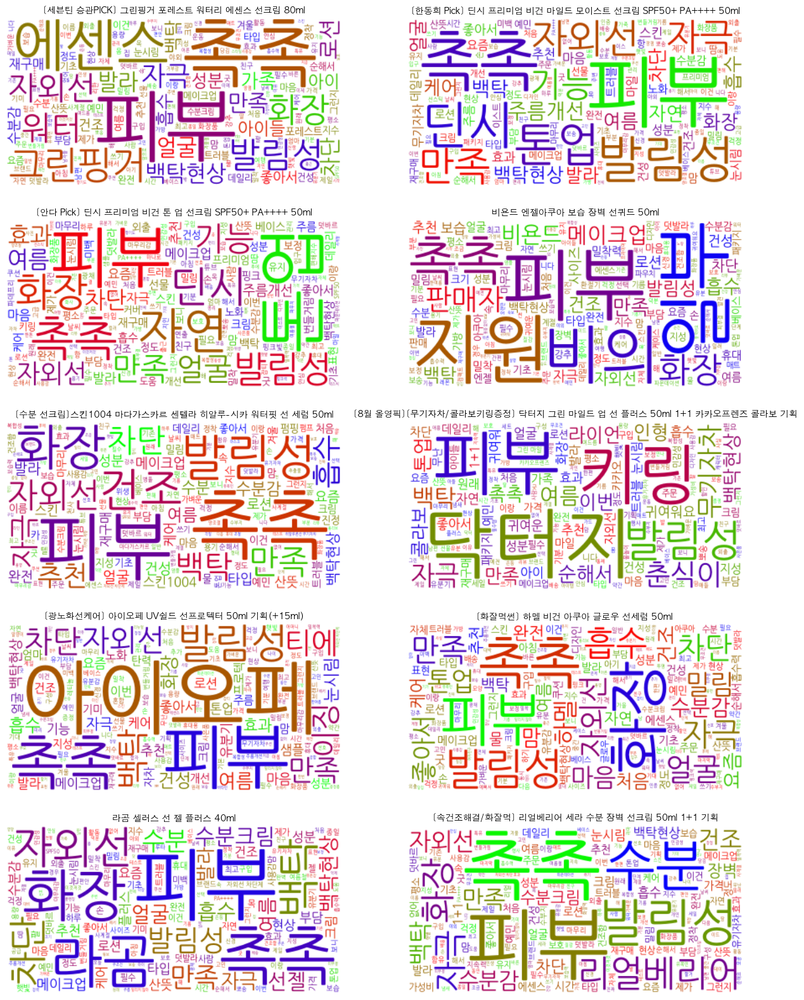

In [29]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(top10_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_High[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

In [30]:
Bottom_product_list = ['[디렉터파이개발]에뛰드 순정 디렉터 톤업 수정 선크림 40ml +20ml 기획',
       '[8월 올영픽]에뛰드 순정 디렉터 톤업 수정 선크림 40ml 1+1 기획',
       '아벤느 선 미네랄 크림 50ml SPF50+ PA++++',
       '[김혜수PICK] AHC 누드 톤업 크림 내추럴 글로우 40ml SPF50+ PA++++',
       '휘게 프레쉬 비건 톤업 선크림 50ml', '바이오더마 포토덤 키드 SPF50+ 100ml',
       '싸이닉 엔조이 파데스킵 톤업 선크림 50g 더블 기획',
       '[파데프리 선크림/더보이즈 큐PICK]듀이트리 어반쉐이드 커버 앤 핏 선 더블기획(40ml+40ml)',
       '[보습장벽/무기자차] 로벡틴 인텐스 모이스처 선크림 50ml (딥 모이스처)',
       '[무기자차]닥터올가 100 선크림 50ml 기획(+30ml 증정)']

In [31]:
Low_df = suncream_review_df[(suncream_review_df['score_group'] =='Low')&(suncream_review_df['product_name'].isin(Bottom_product_list))]

In [32]:
word_count_dict_Low = defaultdict(Counter)

In [33]:
def count_low_words(df):
    for product in Bottom_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_Low[product] += c

In [34]:
count_low_words(Low_df)

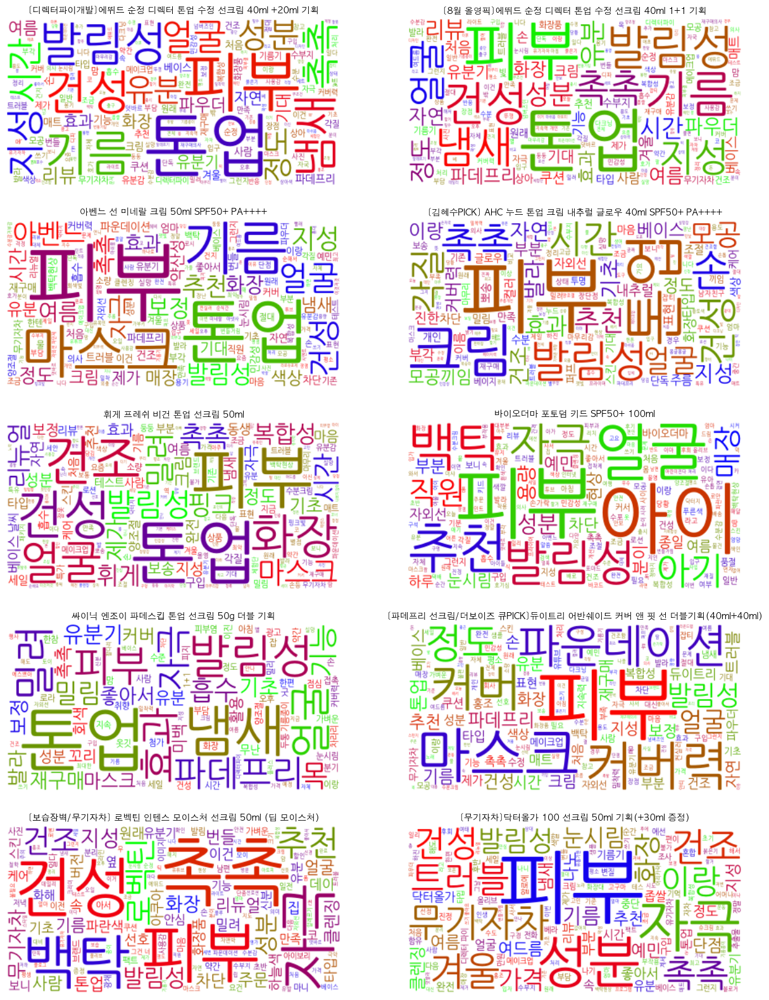

In [35]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5,2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(Bottom_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_Low[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

# 2. 선스틱 상위/하위 제품 리뷰 워드클라우드 시각화

In [37]:
top10_product_list = ['[워터프루프/김고은 PICK] 가히 에어리 핏 선스틱 14g',
       '[안선영 Pick] 딘시 프리미엄 비건 3 in 1 선스틱 SPF50+ PA++++ 10.5g',
       '로우퀘스트 에키네시아 에어리 선스틱 19g',
       '[NEW/3초열진정] 토코보 시카 쿨링 선스틱 18g SPF50+ PA++++',
       '라로제 클린 선스틱 SPF 50 PA++++ 18.5g (워터프루프)',
       '[보송매트]토코보 코튼 소프트 선스틱 19g SPF50+ PA++++',
       '[워터프루프/백송민PICK] 톤핏선 비건 노세범 프라이머 선스틱 SPF50+ PA++++',
       '[박세리 공동개발] AHC 마스터즈 에어리치 선스틱 22g', '[즉각쿨링] 라운드랩 자작나무 수분 선스틱 19g 더블 기획',
       '[급속쿨링]라운드어라운드 컴포트 그린티 에어 선스틱 증정기획(+뽀득폼30ml증정)']

In [38]:
High_df = sunstic_df[(sunstic_df['score_group'] =='High')&(sunstic_df['product_name'].isin(top10_product_list))]

In [39]:
word_count_dict_High = defaultdict(Counter)

In [40]:
def count_High_words(df):
    for product in top10_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_High[product] += c

In [41]:
count_High_words(High_df)

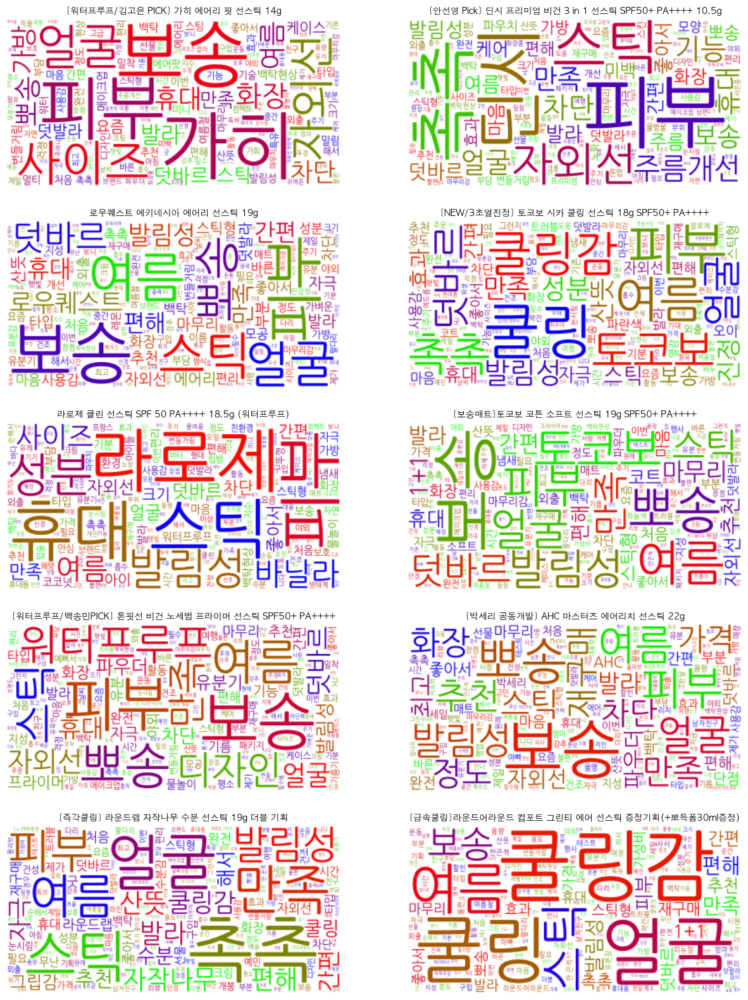

In [42]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(top10_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_High[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

In [43]:
Bottom_product_list = ['[혼합자차/더보이즈 큐PICK]듀이트리 어반쉐이드 피치라이크 톤업 선스틱 13g',
       '닥터아토 실키 포켓 선 스틱 SPF 50+', '브링그린 티트리시카쿨링선스틱 20g 리필기획(배스킨콜라보)',
       '브링그린 티트리시카쿨링선스틱 20g_NEW', '싸이닉 엔조이 슈퍼 액티브 에어리 썬스틱 15g',
       '[진정보송] 차앤박(CNP) 더마 쉴드 선스틱 SPF50+ 18g', '[민감피부] 닥터지 그린마일드 업 선스틱 20g',
       '[소프트-파우더리 시스템] 리쥬란 힐러 UV 프로텍션 밤 19g',
       '[쿨링/더보이즈 큐PICK]듀이트리 어반쉐이드 쿨 카밍 선스틱 20g',
       '김정문알로에 큐어 워터 스플래쉬 쿨링 선스틱 더블기획(23g + 23g)']

In [44]:
Low_df = sunstic_df[(sunstic_df['score_group'] =='Low')&(sunstic_df['product_name'].isin(Bottom_product_list))]

In [45]:
word_count_dict_Low = defaultdict(Counter)

In [46]:
def count_low_words(df):
    for product in Bottom_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_Low[product] += c

In [47]:
count_low_words(Low_df)

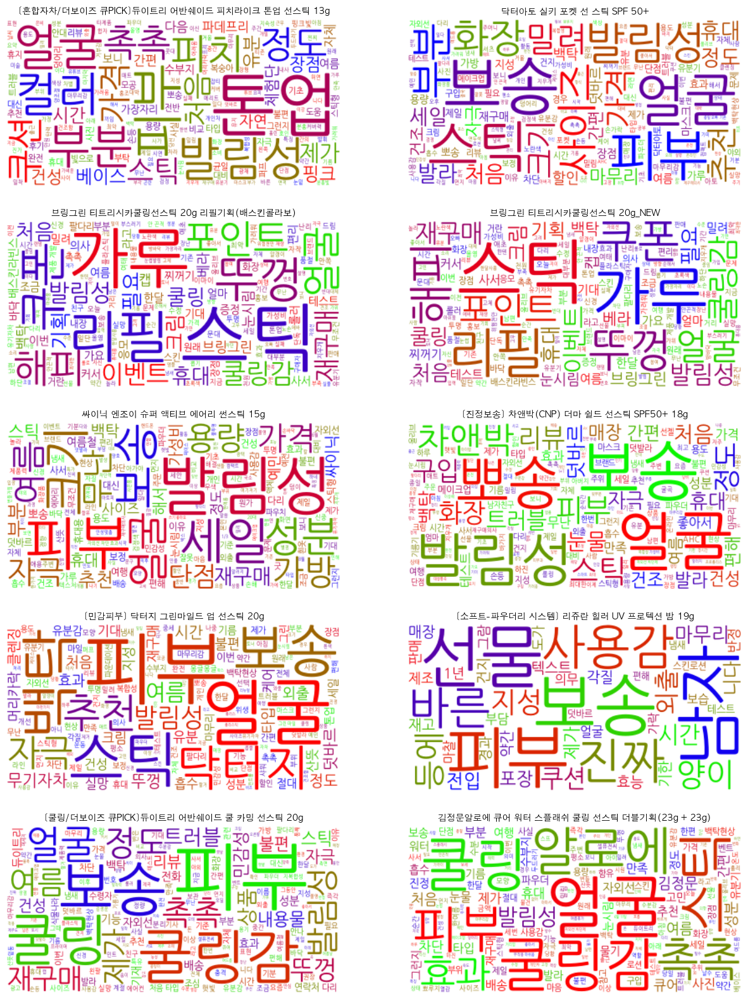

In [48]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5,2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(Bottom_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_Low[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

# 3. 선쿠션 상위/하위 제품 리뷰 워드클라우드 시각화

In [52]:
top10_product_list = ['[스티커 증정]그린핑거 포레스트 멀티 디펜스 선쿠션 산리오 에디션 2종(시나모롤/헬로키티)',
       '[NEW] 아떼 속광 톤업 선쿠션 SPF50+/PA++++',
       '[NEW/민감진정]AGE20S 선 에센스 팩트 무기자차 카밍 롱 프로텍션 12.5g (본품+리필)',
       '[오롤리콜라보]AGE20S 선 에센스팩트 카밍 롱 프로텍션 12.5g*2 (+파우치, 스티커 증정)',
       '[파데프리/프롬젤라PICK] 톤핏선 비건 핑베 톤업 선쿠션 SPF50+ PA++++',
       '식물나라 뽀얀쌀 생기 톤업 선쿠션 보노보노 기획 2종 (01호/02호)',
       '식물나라 뽀얀쌀 생기 톤업 선 쿠션 단품(01 뽀얀 화이트/02생기 피치)',
       '[1+1][간편밀착] 달바 워터풀 톤업 선 쿠션 듀오 기획(15g+15g)',
       '[NEW] 브링그린 티트리시카톤업선쿠션 리필기획(배스킨콜라보)', '브링그린 티트리시카톤업선쿠션 15g_NEW']

In [53]:
High_df = suncushion_df[(suncushion_df['score_group'] =='High')&(suncushion_df['product_name'].isin(top10_product_list))]

In [54]:
word_count_dict_High = defaultdict(Counter)

In [55]:
def count_High_words(df):
    for product in top10_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_High[product] += c

In [56]:
count_High_words(High_df)

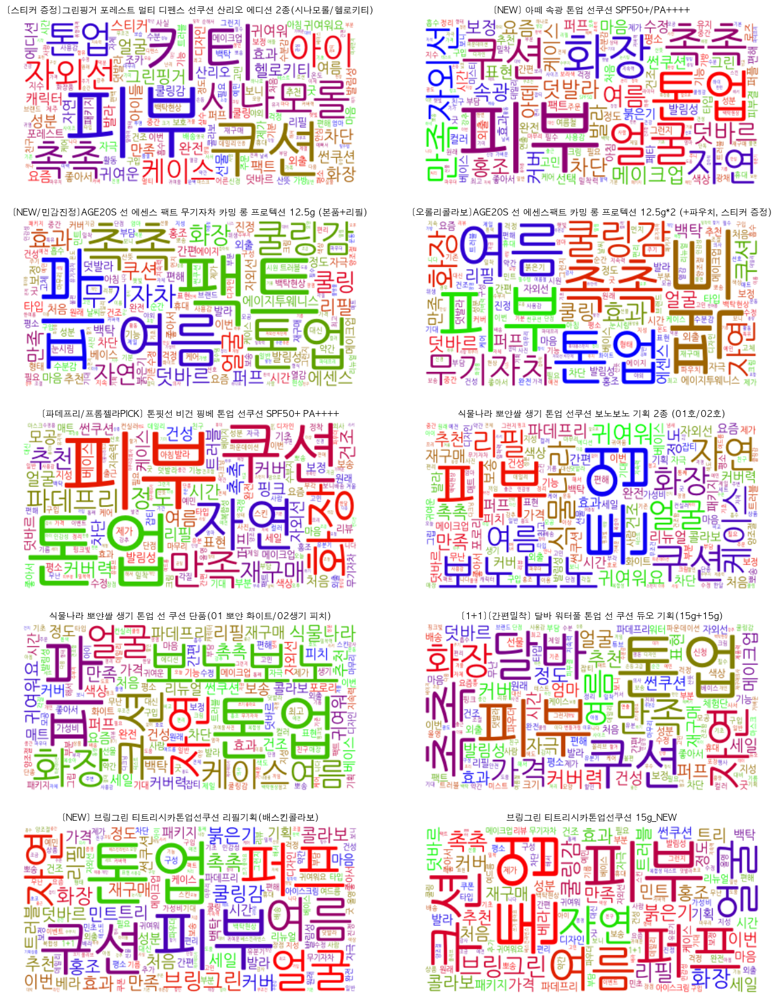

In [57]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5, 2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(top10_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_High[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

In [59]:
Bottom_product_list = ['카트린 내추럴100 썬킬RX 선파우더 SPF46 PA+++',
       '[무기자차/더보이즈 큐PICK]듀이트리 어반쉐이드 커버 앤 핏 선쿠션 14g',
       '[파데프리] 넘버즈인 3번 도자기결 고이빚은 세라믹쿠션 SPF50+ PA++++',
       '[오롤리콜라보]AGE20S 핑크 수분광 글로우핏 톤업 선팩트 12.5g*2 (+파우치, 스티커 증정)',
       '[배라콜라보] 브링그린 티트리시카 선 3종(선크림/선스틱/선쿠션)',
       '김정문알로에 큐어 아쿠아 마일드 쿨링 선쿠션 리필 기획(25g+리필)',
       '셀퓨전씨 토닝 썬쿠션 13g SPF 50+/PA++++', '[수분쿨링] 라운드랩 자작나무 수분 선쿠션 15g',
       '[생기톤업] 달바 워터풀 톤업 선 쿠션 15g', 'AHC 세이프온 마일드 선 쿠션 25g']

In [60]:
Low_df = suncushion_df[(suncushion_df['score_group'] =='Low')&(suncushion_df['product_name'].isin(Bottom_product_list))]

In [61]:
word_count_dict_Low = defaultdict(Counter)

In [62]:
def count_low_words(df):
    for product in Bottom_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_Low[product] += c

In [63]:
count_low_words(Low_df)

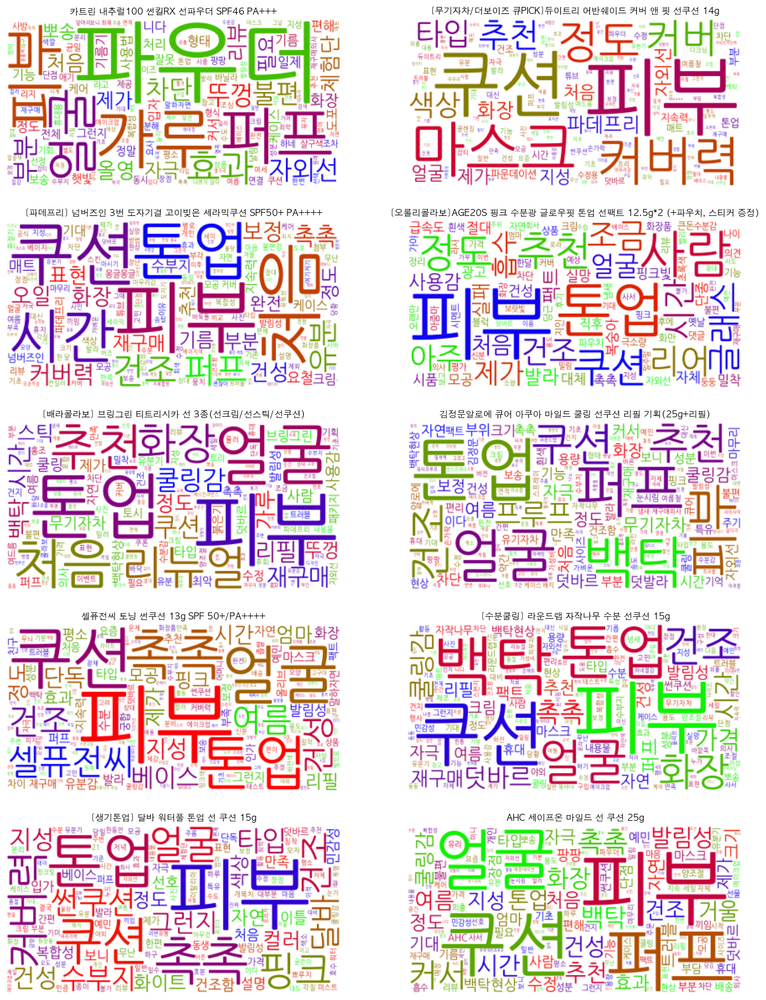

In [64]:
# 서브플롯 레이아웃 설정 (2x5 레이아웃)
fig, axes = plt.subplots(5,2, figsize=(15, 20))
# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(Bottom_product_list):
    ax = axes[i // 2, i % 2]
    word_cloud = WordCloud(
    font_path = "/Library/Fonts/NanumGothic.otf",
    background_color="white",
    colormap="brg",
    ).generate_from_frequencies(word_count_dict_Low[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)  # 제목을 너무 길지 않게 표시

# 4. 선패치 상위/하위 제품 리뷰 워드클라우드 시각화

In [95]:
top3_product_list = ['[NEW] 싸이닉 엔조이 아웃도어 쿨링 선 패치 4개입', '[초특가]식물나라 UV차단 아웃도어 선패치(2eaX5sets)',
       '에이바자르 액티비티 화이트닝 아이패치 4회분']

In [96]:
High_df =sunpatch_df[(sunpatch_df['score_group'] =='High')&(sunpatch_df['product_name'].isin(top3_product_list))]

In [97]:
word_count_dict_High = defaultdict(Counter)

In [98]:
def count_High_words(df):
    for product in top3_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_High[product] += c

In [99]:
count_High_words(High_df)

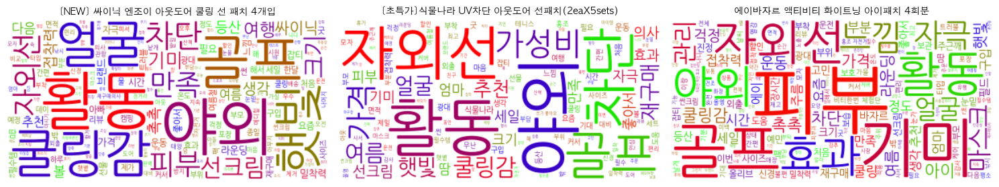

In [101]:
# 서브플롯 레이아웃 설정 (1x3 레이아웃)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(top3_product_list):
    ax = axes[i]  # 1x3 레이아웃에서 인덱스에 따라 서브플롯 선택
    word_cloud = WordCloud(
        font_path="/Library/Fonts/NanumGothic.otf",
        background_color="white",
        colormap="brg",
    ).generate_from_frequencies(word_count_dict_High[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)

# 레이아웃 조정
plt.tight_layout()
plt.show()


In [116]:
Bottom_product_list = ['프란츠 네이키드 선쉴드 펩타이드 패치 L사이즈 5개입',
       '[4매입/나비존집중] 메디힐 유브이 컷 아웃도어 선 패치 [트리플 프로텍션]',
       '[박세리 공동개발] AHC 마스터즈 프로 패치 2스텝 4매']

In [117]:
Low_df = sunpatch_df[(sunpatch_df['score_group'] =='Low')&(sunpatch_df['product_name'].isin(Bottom_product_list))]

In [118]:
word_count_dict_Low = defaultdict(Counter)

In [119]:
def count_low_words(df):
    for product in Bottom_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_Low[product] += c

In [120]:
count_low_words(Low_df)

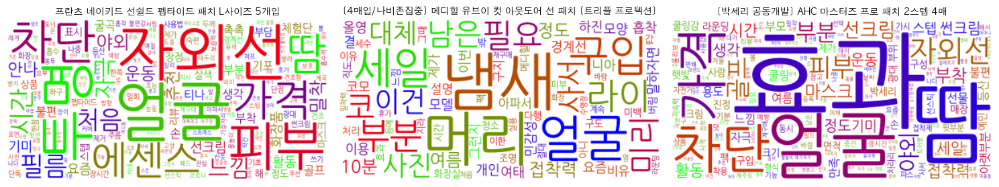

In [122]:
# 서브플롯 레이아웃 설정 (1x3 레이아웃)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(Bottom_product_list):
    ax = axes[i]  # 1x3 레이아웃에서 인덱스에 따라 서브플롯 선택
    word_cloud = WordCloud(
        font_path="/Library/Fonts/NanumGothic.otf",
        background_color="white",
        colormap="brg",
    ).generate_from_frequencies(word_count_dict_Low[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)

# 레이아웃 조정
plt.tight_layout()
plt.show()


# 5. 선스프레이 상위/하위 제품 리뷰 워드클라우드 시각화

In [123]:
top3_product_list = ['아넷사 퍼펙트 UV 선스크린 스킨케어 스프레이 60g', 'AHC 마스터즈 수딩 아웃도어 선스프레이 55ml',
       '식물나라 워터프루프 선 스프레이 1+1 기획']

In [124]:
High_df =sunspray_df[(sunspray_df['score_group'] =='High')&(sunspray_df['product_name'].isin(top3_product_list))]

In [125]:
word_count_dict_High = defaultdict(Counter)

In [126]:
def count_High_words(df):
    for product in top3_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_High[product] += c

In [127]:
count_High_words(High_df)

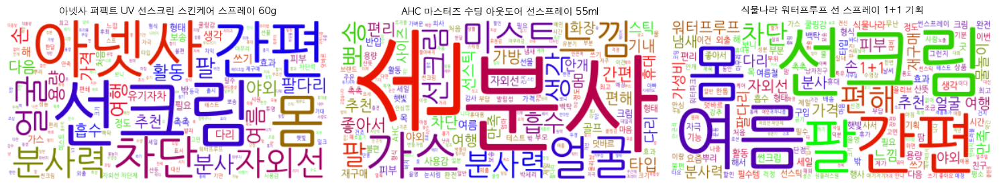

In [128]:
# 서브플롯 레이아웃 설정 (1x3 레이아웃)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(top3_product_list):
    ax = axes[i]  # 1x3 레이아웃에서 인덱스에 따라 서브플롯 선택
    word_cloud = WordCloud(
        font_path="/Library/Fonts/NanumGothic.otf",
        background_color="white",
        colormap="brg",
    ).generate_from_frequencies(word_count_dict_High[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)

# 레이아웃 조정
plt.tight_layout()
plt.show()


In [129]:
Bottom_product_list = ['닥터아토 쿨링선스프레이150ml', '식물나라 워터프루프 선 스프레이 1+1 기획',
       'AHC 마스터즈 수딩 아웃도어 선스프레이 55ml']

In [130]:
Low_df = sunspray_df[(sunspray_df['score_group'] =='Low')&(sunspray_df['product_name'].isin(Bottom_product_list))]

In [131]:
word_count_dict_Low = defaultdict(Counter)

In [132]:
def count_low_words(df):
    for product in Bottom_product_list:
        filter_df = df[df['product_name'] == product]
        for review in filter_df['processed_review']:
            c = Counter([x for x in review])
            word_count_dict_Low[product] += c

In [133]:
count_low_words(Low_df)

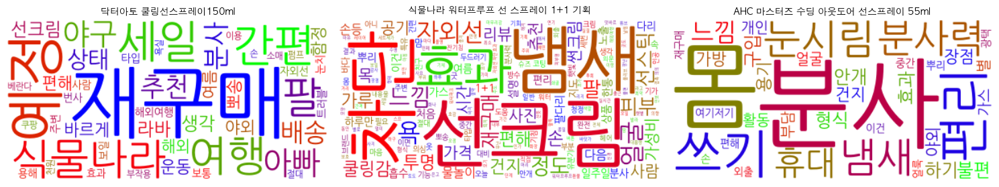

In [134]:
# 서브플롯 레이아웃 설정 (1x3 레이아웃)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# 각 제품에 대한 워드 클라우드 생성 및 서브플롯에 배치
for i, product in enumerate(Bottom_product_list):
    ax = axes[i]  # 1x3 레이아웃에서 인덱스에 따라 서브플롯 선택
    word_cloud = WordCloud(
        font_path="/Library/Fonts/NanumGothic.otf",
        background_color="white",
        colormap="brg",
    ).generate_from_frequencies(word_count_dict_Low[product])
    ax.imshow(word_cloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(product, fontsize=10)

# 레이아웃 조정
plt.tight_layout()
plt.show()
